<a href="https://colab.research.google.com/github/karthika-mv-team/karthika-mv-team/blob/main/Training_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ANALYSIS OF DISPATCHER MODEL BUILT ON 04_05_2022


### IMPORT LIBRARIES

In [ ]:
from __future__ import print_function
from __future__ import division
import collections
from dis import dis
import torch
import torch.optim as optim
import numpy as np
import time
import os
import copy
import csv
import warnings
import json
import numpy as np
import pandas as pd
!pip install seaborn
import seaborn as sns
import matplotlib.pyplot as plt
import fnmatch
from PIL import Image, ImageDraw, ImageFont
import collections
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
warnings.filterwarnings("ignore", category=UserWarning)

# local imports
from data import *
from utils import *
from architectures import *


In [ ]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## APPLY TRANSFORMS ON IMAGE DATA

The train,test and validation data must come from the same distribution for consistency in results.<br>
Hence we normalize the image data and apply the same transforms on it as train data

In [ ]:
#----------------------------------Helper Function----------------------#
imsize = 224
RESNEXT_MEAN = [0.485, 0.456, 0.406]
RESNEXT_STD = [0.229, 0.224, 0.225]

loader = transforms.Compose([transforms.Resize((224,224)), 
                             transforms.ToTensor(),
                            # for RGB without augmentations:
                            transforms.Normalize(
                                mean = RESNEXT_MEAN,
                                std = RESNEXT_STD
                                )
                            ])

def image_loader(image_name):
    """load image, returns cuda tensor"""
    image = Image.open(image_name).convert("RGB")
#     print(image)
    image = loader(image)
    image = torch.tensor(image, requires_grad=True)
    image = image.unsqueeze(0)
    return image.cuda()  #assumes that you're using GPU
    # return image

## LOAD THE CHECKPOINTED MODEL

In [ ]:
# %%capture --no-display
#-------------------------------------Set device and Variables------------------------
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
# print("PyTorch Version: ",torch.__version__)
# print(" The device is : ", device)

# CONSTANTS
MIN_SAVE_VAL_MSE = 0.001 # checkpoint threshold, only those epochs that achieve values lesser will be saved.
NUM_WORKERS = 12
DISPLAY_PRECISION = 7
CLASS_WEIGHTS_PATH = './data/dispatcher_training_data/dispatcher_class_weights.json'
arg_max_array = ["men_shoes","tag", "shirt_t-shirt", "hoodies_n_jackets","women_shoes","women_top"]
label_map = { 0:"hoodies_n_jackets" ,1:"men_shoes",2:"shirt_tshirt",3:"tag",4:"women_shoes",5:"women_top"}
predictions_track = pd.DataFrame(columns=['file_path', 'Predicted', 'Actual'])

# read file
with open('./checkpoints/2022_5_4/test_acc_na_val_mse_0.0001173013951743856_train/hyper_parameters.json', 'r') as myfile:
    data=myfile.read()

# parse file
model_hyper_parameters = eval(json.loads(data))
trial_model_name = model_hyper_parameters['model_name']
trial_hidden_size = model_hyper_parameters['hidden_size']
trial_feature_extract = model_hyper_parameters['feature_extract'] = True
trial_use_pretrained = model_hyper_parameters['use_pretrained'] = True

# training parameters
trial_batch_size = model_hyper_parameters['batch_size']
trial_num_epochs = model_hyper_parameters['num_epochs']
trial_fine_tune_from_epoch = model_hyper_parameters['fine_tune_from_epoch']
trial_fine_tune_lr_factor = model_hyper_parameters['fine_tune_lr_factor']

# optimizer parameters
trial_learning_rate = model_hyper_parameters['learning_rate']
trial_sched_factor = model_hyper_parameters['sched_factor']
trial_lr_patience = model_hyper_parameters['lr_patience']

#---------------------------------------- PREPARE MODEL --------------------------------------------#
model_ft, input_size = initialize_model(
    trial_model_name,
    trial_hidden_size,
    trial_feature_extract,
    trial_use_pretrained
    )

#load checkpoint
checkpoint = torch.load('./checkpoints/2022_5_4/test_acc_na_val_mse_0.0001173013951743856_train/model_resnext50_lr_0.00021714207415025495_bs_64_ep_34_hidden_64_sched_0.6902558235542041_lrpat_2.pth.tar',map_location=torch.device('cpu'))

#Store architecture of the model in this dictionary
from collections import OrderedDict
new_state_dict = OrderedDict()
for k, v in checkpoint['state_dict'].items():
    name = k[7:] # remove the word "module."
    new_state_dict[name] = v

model_ft.load_state_dict(new_state_dict) 
model_ft.to(device)
model_ft.eval() 

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

## MAKE PREDICTIONS FOR THE DATASET

In [ ]:
def make_predictions(input_csv):
    # initialise
    store_file_paths_plus_prediction=[]
    counter = 0
    mysoftmax= nn.Softmax()
    dict_of_predictions = collections.defaultdict(int)
    test_data = pd.read_csv(input_csv)
    original_data = {}
    accuracy = 0
    true, predicted = [],[]
    for idx,row in test_data.iterrows():
        image_path, label = row['file_path'],row['image_type_fact']
        if label_map[label] not in original_data:
            original_data[label_map[label]] = 1
        else:
            original_data[label_map[label]] += 1    
        true.append(label_map[label])
        my_image = image_loader(image_path)
        predictions=model_ft(my_image)
        final_predictions = mysoftmax(predictions[0])
        prediction_array = final_predictions[0].detach().to('cpu').numpy()
        arg_max_number=prediction_array.argmax(axis=0)
        predicted.append(label_map[arg_max_number])
        predictions_track.loc[idx, 'file_path'] = image_path
        predictions_track.loc[idx,'Predicted'] = label_map[arg_max_number]
        predictions_track.loc[idx,'Actual'] = label_map[label]
        if (arg_max_number==label):
            accuracy+=1
        final_image_arr = [image_path,arg_max_number,list(prediction_array)]
        store_file_paths_plus_prediction.append(final_image_arr)
        counter+=1
        dict_of_predictions[arg_max_array[arg_max_number]] += 1
    print("The accuracy of the overall model is : {:.2f} %".format((accuracy/counter)*100))
    original_data = pd.DataFrame(original_data.items(), columns=['Category', 'Number of Samples']) 
    return (true,predicted)

## VISUALISE RESULTS AS CONFUSION MATRIX

In [ ]:
def disp_confusion_matrix(predictions, TEST=False, VAL=False):
    true = predictions[0]
    predicted = predictions[1]
    cm = confusion_matrix(true, predicted)
    # Normalise to display output as a fraction of 1
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    recall = np.diag(cm) / np.sum(cm, axis = 1)
    precision = np.diag(cm) / np.sum(cm, axis = 0)
#     print('The recall for the model is : {:.2f}%' .format(np.mean(recall)*100))
#     print('The precision for the model is : {:.2f}%'.format(np.mean(precision)))
    plt.rcParams["figure.figsize"] = (10,10)
    ax = sns.heatmap(cm, annot=True, cmap='Blues',annot_kws={"size":20},fmt=".2f")
    if TEST == True:
        ax.set_title('Dispatcher Confusion Matrix Test Data\n\n',fontsize=20)
        ax.set_xlabel('\nPredicted Values',fontsize=20)
        ax.set_ylabel('Actual Values',fontsize=20)
        ax.xaxis.set_ticklabels(sorted(['hoodies_n_jackets', 'men_shoes', 'shirt_t-shirt', 'tag', 'women_shoes', 'women_top',]),fontsize=12)
        ax.yaxis.set_ticklabels(sorted(['hoodies_n_jackets', 'men_shoes', 'shirt_t-shirt', 'tag', 'women_shoes', 'women_top',]),fontsize=12)
        plt.savefig('../test_confusion_matrix.png')
        plt.show()
        
    elif VAL == True:
        ax.set_title('Dispatcher Confusion Matrix Validation Data\n\n',fontsize=20)
        ax.set_xlabel('\nPredicted Values',fontsize=20)
        ax.set_ylabel('Actual Values',fontsize=20)    
        # Ticket labels - List must be in alphabetical order
        ax.xaxis.set_ticklabels(sorted(['hoodies_jackets', 'men_shoes', 'shirt_t-shirt', 'tag', 'women_shoes', 'women_top']),fontsize=12)
        ax.yaxis.set_ticklabels(sorted(['hoodies_jackets', 'men_shoes', 'shirt_t-shirt', 'tag', 'women_shoes', 'women_top']),fontsize=12)
        plt.savefig('../validation_confusion_matrix.png')
        plt.show()
    

The accuracy of the overall model is : 88.31 %


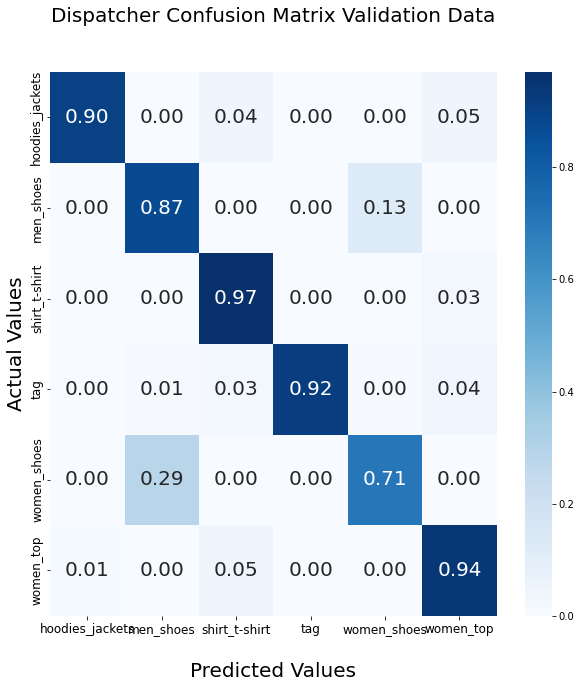

In [ ]:
validation_input = './data/dispatcher_training_data/dispatcher_val.csv'
predicted_op = make_predictions(validation_input)
disp_confusion_matrix(predicted_op, VAL=True)

## Analysing the Predictions

In [ ]:
def visualise_results(category):
    #----------------------------------------------True Positives--------------------------------------------
    plt.figure(figsize=(30,9))
    plt.suptitle('True Positives for the {} category '.format(category),fontsize=35)
    idx = 0
    True_Positives = predictions_track[(predictions_track['Predicted'] == category) & (predictions_track['Actual'] == category)]
    for filename in True_Positives['file_path'].sample(5):
#         print(filename)
        plt.subplot(1,5,idx+1).set_title("Actual : {} \n Predicted : {} ".\
                                         format(np.select(True_Positives['file_path'] == str(filename),\
                                       True_Positives['Actual']),np.select(True_Positives['file_path'] == str(filename),\
                                           True_Positives['Predicted']) ), fontsize=25)
        idx+=1
        plt.imshow(Image.open(filename))

    #----------------------------------------------True Negatives--------------------------------------------
    plt.figure(figsize=(30,9))
    plt.suptitle('True Negatives for the {} category '.format(category),fontsize=35)
    idx = 0
    True_Negatives = predictions_track[(predictions_track['Predicted'] != category) & (predictions_track['Actual'] != category)]
    for filename in True_Negatives['file_path'].sample(5):
        plt.subplot(1,5,idx+1).set_title("Actual : {} \n Predicted : {} ".\
                                         format(np.select(True_Negatives['file_path'] == str(filename),\
                                       True_Negatives['Actual']),np.select(True_Negatives['file_path'] == str(filename),\
                                           True_Negatives['Predicted']) ), fontsize=25)
        idx+=1
        plt.imshow(Image.open(filename))

    #----------------------------------------------False Positives--------------------------------------------
    plt.figure(figsize=(30,9))
    plt.suptitle('False Positives for the {} category '.format(category),fontsize=35)
    idx = 0
    False_Positives = predictions_track[(predictions_track['Predicted'] == category) & (predictions_track['Actual'] != category)]
    for filename in False_Positives['file_path'].sample(5):
        plt.subplot(1,5,idx+1).set_title("Actual : {} \n Predicted : {} ".\
                                         format(np.select(False_Positives['file_path'] == str(filename),\
                                       False_Positives['Actual']),np.select(False_Positives['file_path'] == str(filename),\
                                           False_Positives['Predicted']) ), fontsize=25)
        idx+=1
        plt.imshow(Image.open(filename))

    #----------------------------------------------False Negatives--------------------------------------------
    plt.figure(figsize=(30,9))
    plt.suptitle('False Negatives for the {} category '.format(category),fontsize=35)
    idx = 0
    False_Negatives = predictions_track[(predictions_track['Predicted'] != category) & (predictions_track['Actual'] == category)]
    for filename in False_Negatives['file_path'].sample(5):
        plt.subplot(1,5,idx+1).set_title("Actual : {} \n Predicted : {} ".\
                                         format(np.select(False_Negatives['file_path'] == str(filename),\
                                       False_Negatives['Actual']),np.select(False_Negatives['file_path'] == str(filename),\
                                           False_Negatives['Predicted']) ), fontsize=25)
        idx+=1
        plt.imshow(Image.open(filename))

#     print('The total number of {} in the dataset is : {}'.format(category, len(predictions_track[predictions_track.Actual==category])))
#     print('The total True Positives for the {} category is : {}'.format(category,len(True_Positives)))
#     print('The total True Negatives for the {} category is : {}'.format(category, len(True_Negatives)))
#     print('The total False Positives for the {} category is : {}'. format(category, len(False_Positives)))
#     print('The total False Negatives for the {} category is : {}'.format(category, len(False_Negatives)))

#     # print('Accuracy for the {} category is : {} '.format(category, (len(True_Positives)+len(True_Negatives))//predictions_track.shape[0]))

## Analysing the Predictions for the Men Shoes Category

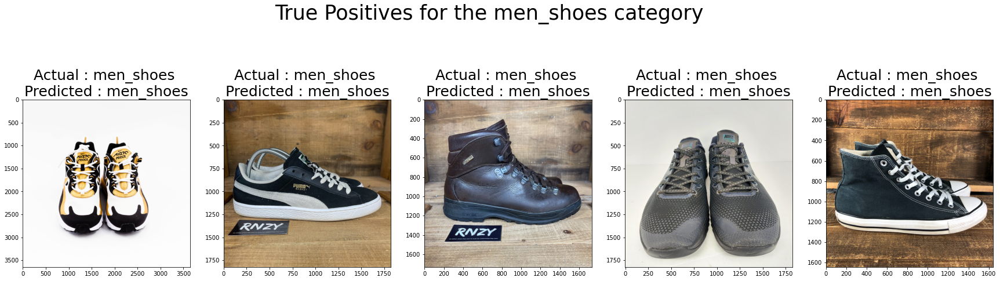

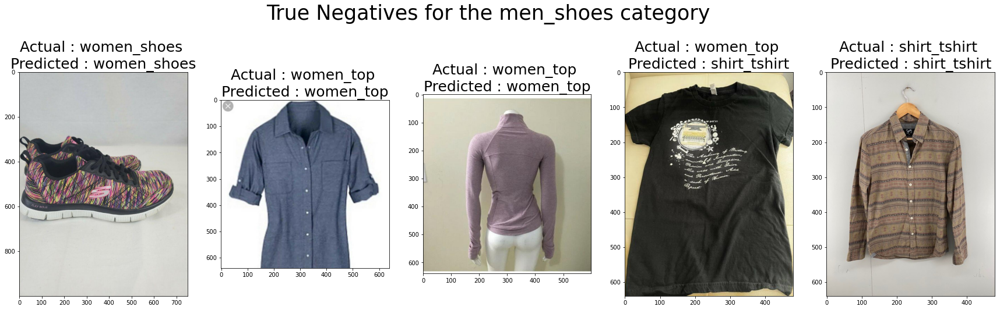

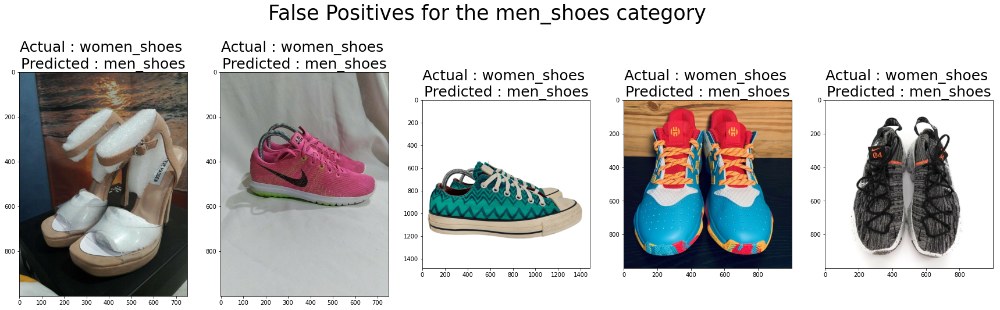

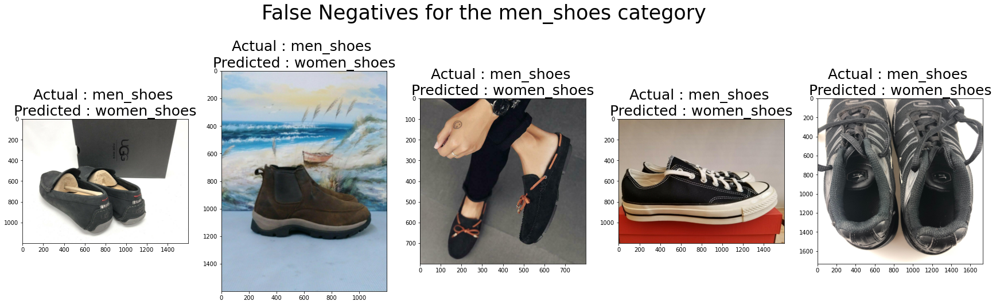

In [ ]:
visualise_results('men_shoes')

## Analysing the Predictions for the Hoodies And Jackets Category

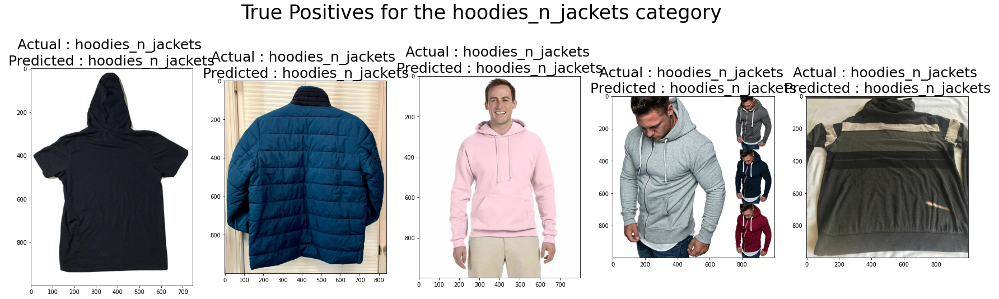

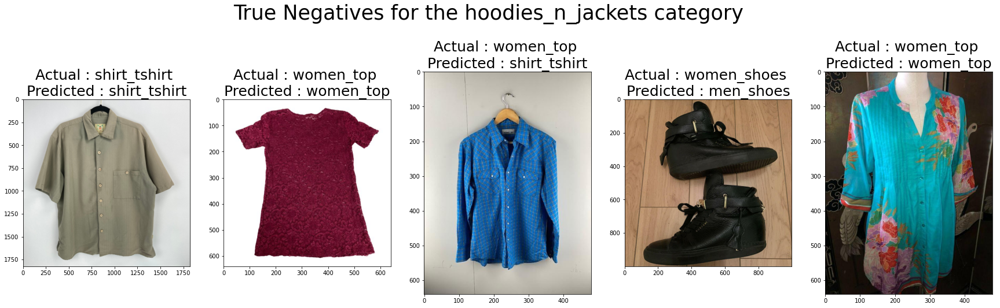

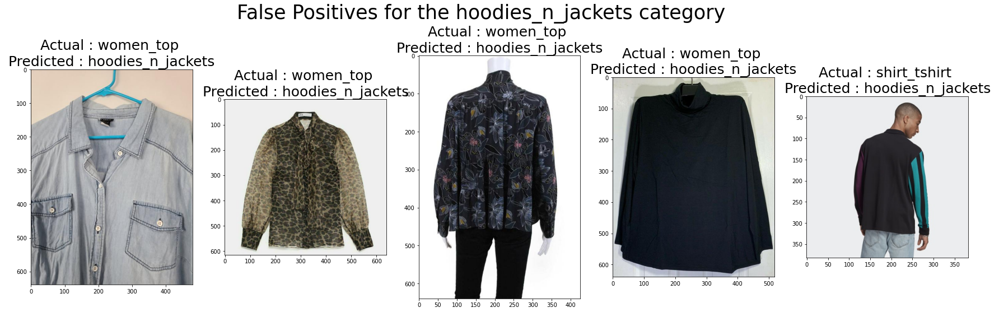

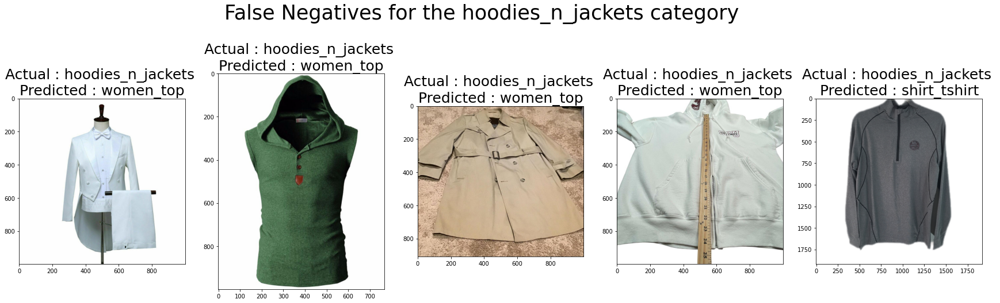

In [ ]:
visualise_results('hoodies_n_jackets')

## Analysing the Predictions for the Tags Category

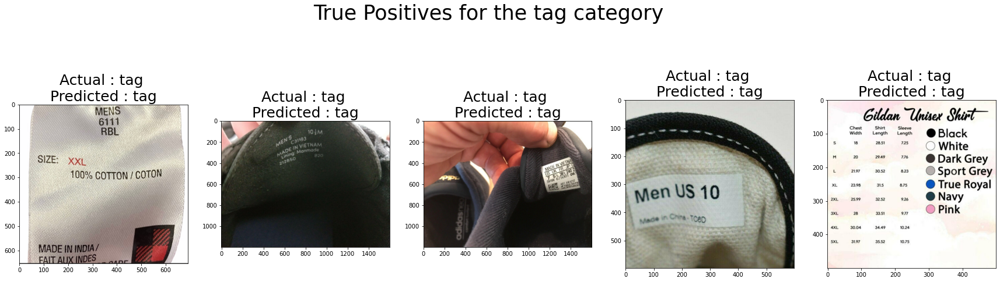

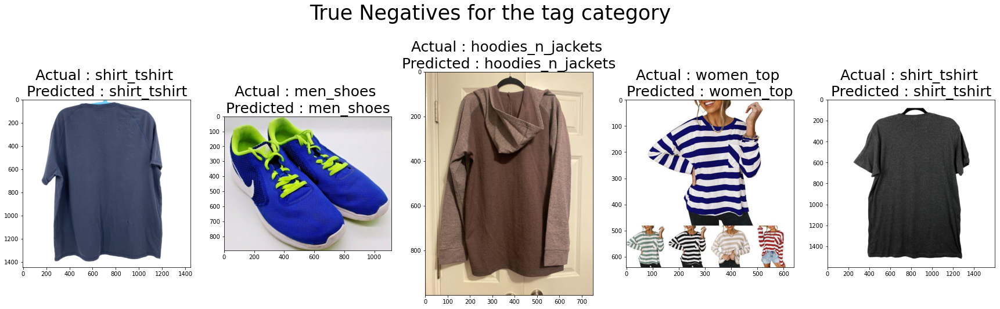

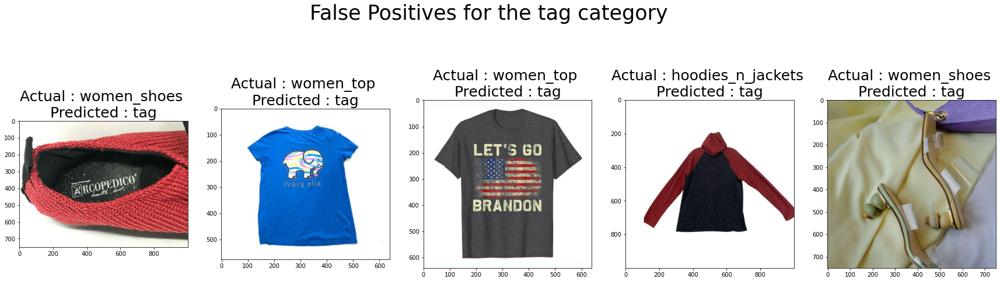

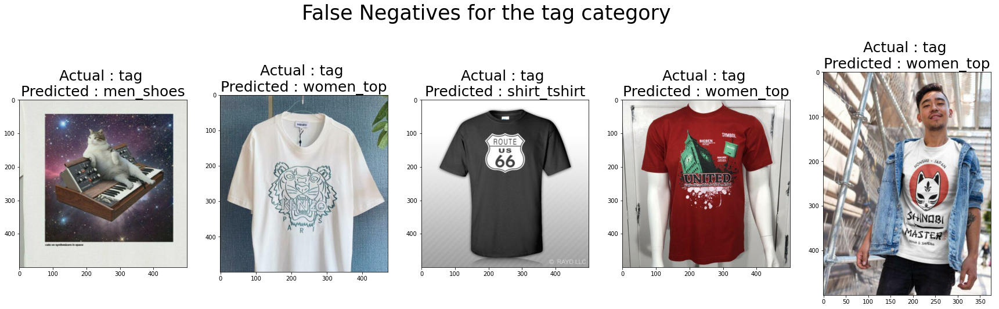

In [ ]:
visualise_results('tag')

## Analysing the Predictions for the Shirts and T-shirts - MEN Category

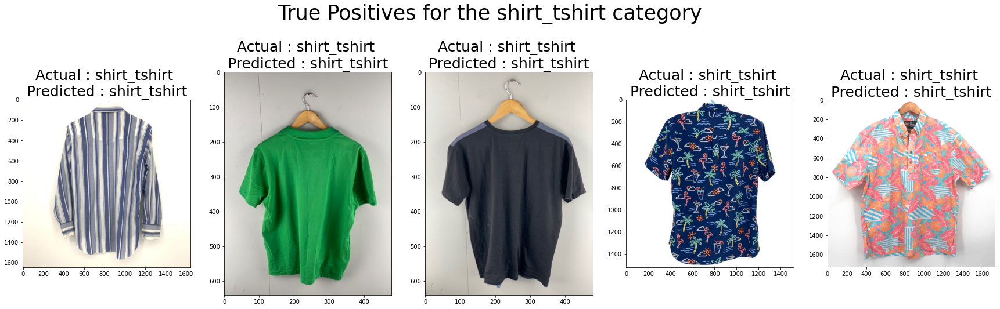

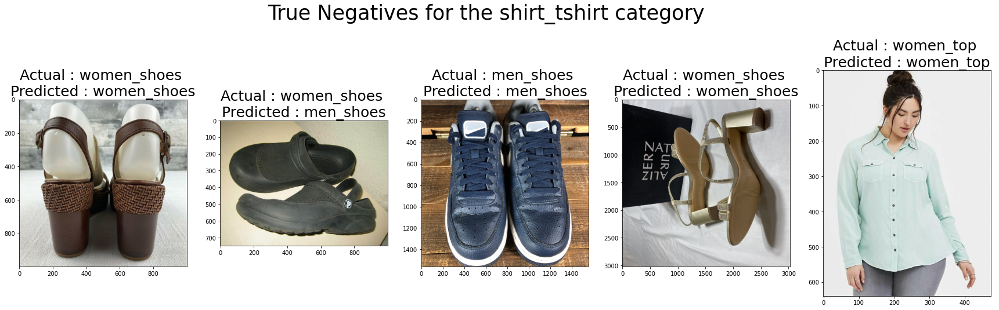

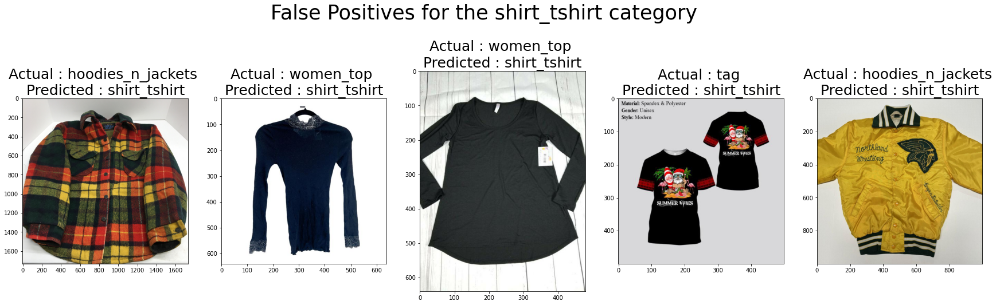

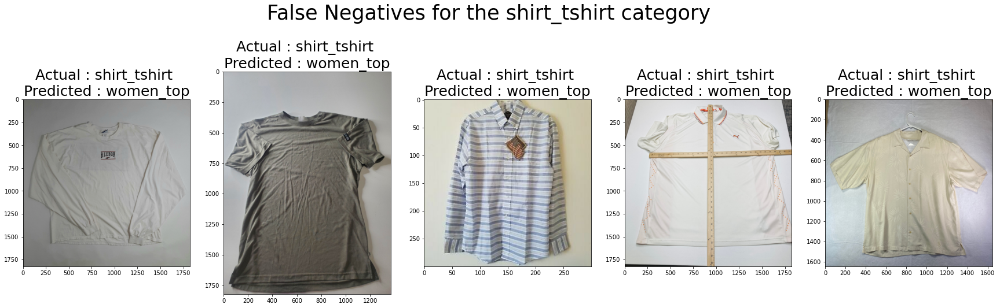

In [ ]:
visualise_results('shirt_tshirt')

## Analysing the Predictions for the Women Shoes Category

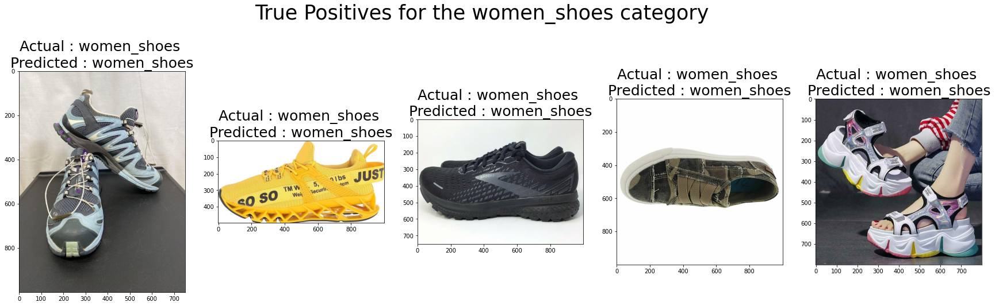

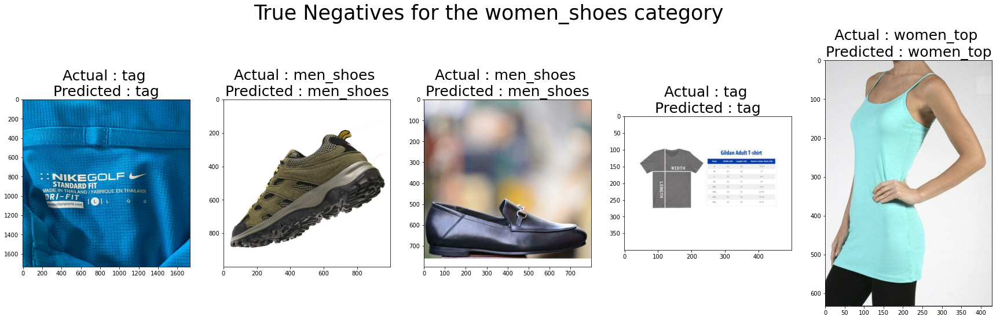

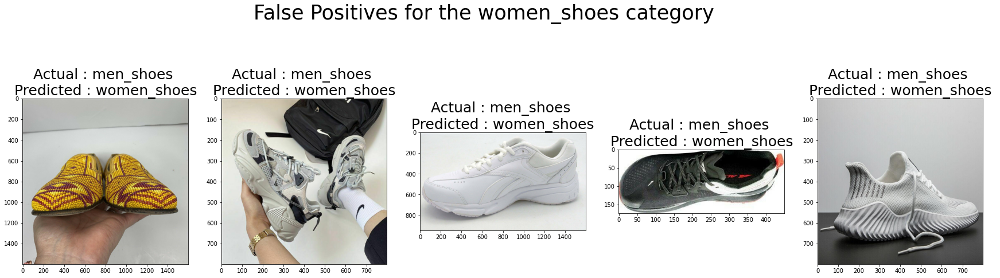

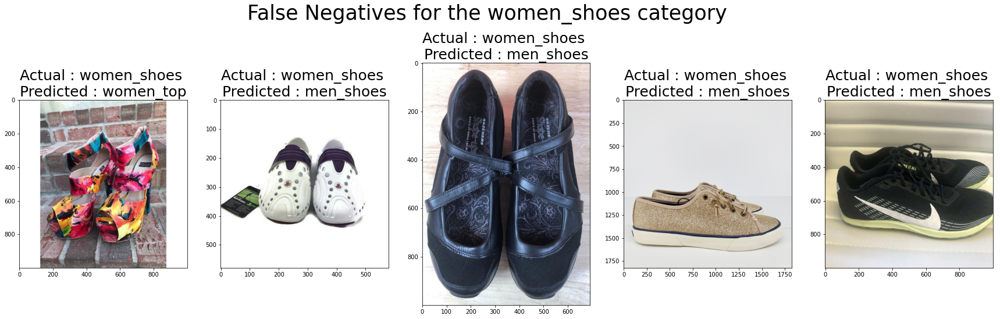

In [ ]:
visualise_results('women_shoes')

## Analysing the Predictions for the Women Top Category

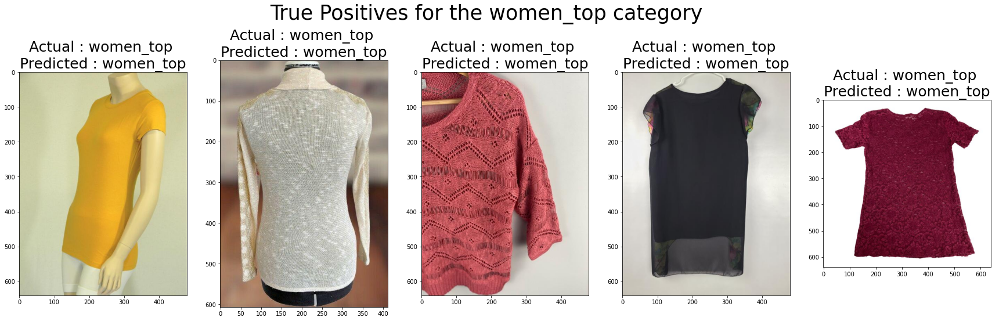

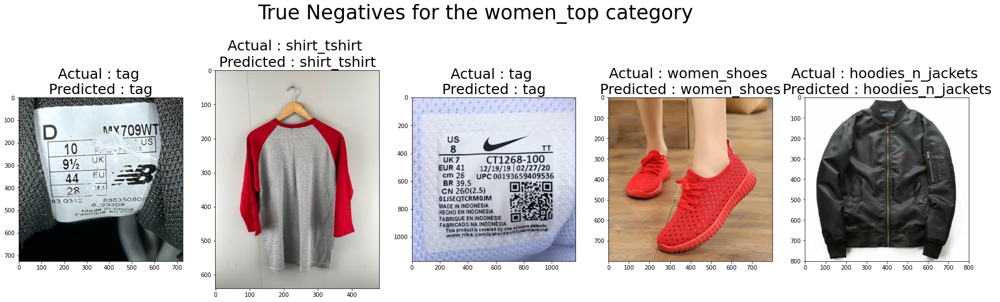

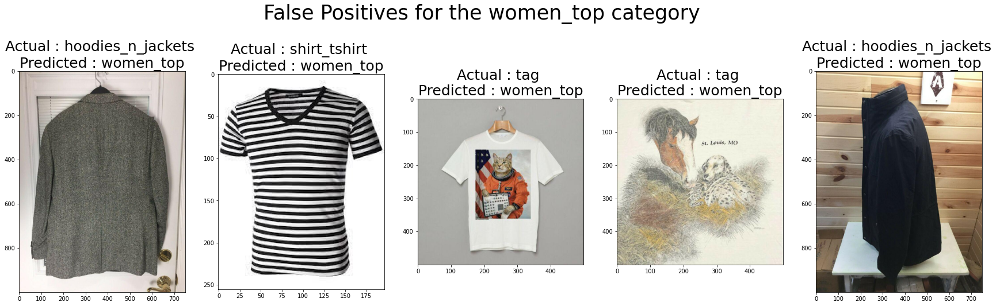

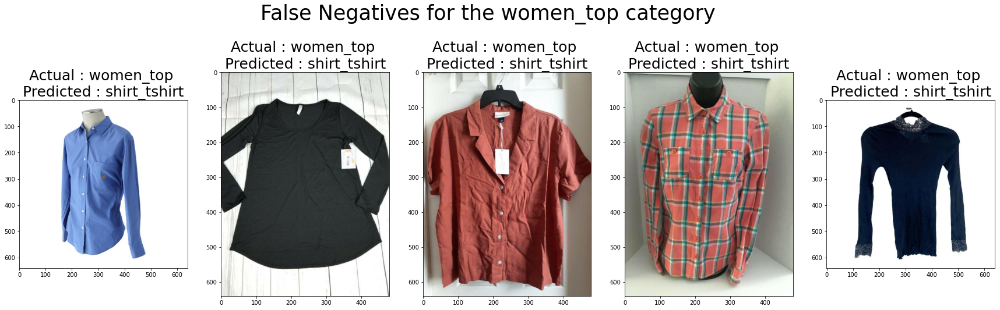

In [ ]:
visualise_results('women_top')